In [1]:
import os
import json
import torch
import random
import torch.nn as nn
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from transformers import CLIPProcessor, CLIPModel, AutoTokenizer, GPT2LMHeadModel
import gc

C:\Users\Ishaan\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# Config
image_dir = "images/train"  # path to images folder
json_path = "sis/sis.json"  # path to SIS annotations

# Load local GPT-2 and CLIP
device = "cpu"  # use CPU to avoid memory crashes

llm_id = "gpt2"
tokenizer = AutoTokenizer.from_pretrained(llm_id)
tokenizer.pad_token = tokenizer.eos_token  #Add padding token
tokenizer.padding_side = "right"

llm_model = GPT2LMHeadModel.from_pretrained(llm_id).to(device)
llm_model.resize_token_embeddings(len(tokenizer))

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# lad JSON and Group by album_id
with open(json_path, 'r') as f:
    nested_data = json.load(f)["annotations"]

# Flatten if annotations is a list of lists
raw_data = [item for sublist in nested_data for item in sublist] if isinstance(nested_data[0], list) else nested_data

def group_sequences_by_album(data):
    albums = {}
    for item in data:
        album_id = item["album_id"]
        albums.setdefault(album_id, []).append(item)

    sequences = []
    for album_id, entries in albums.items():
        ordered = sorted(entries, key=lambda x: x["worker_arranged_photo_order"])  # Order by photo order
        unique_images = []
        seen = set()
        for x in ordered:
            if x["photo_flickr_id"] not in seen:
                seen.add(x["photo_flickr_id"])
                unique_images.append(x)
            if len(unique_images) == 3:  # Ensure we take only 3 images
                break
        if len(unique_images) < 3:
            continue
        img_ids = [x["photo_flickr_id"] for x in unique_images]
        captions = [x["text"] for x in unique_images]

        if all(os.path.exists(os.path.join(image_dir, f"{img}.jpg")) for img in img_ids):
            sequences.append({
                "images": img_ids,
                "caption": " ".join(captions)
            })
    return sequences

sequences = group_sequences_by_album(raw_data)
if len(sequences) < 2:
    raise ValueError("Not enough valid sequences found in images/ to split train/test. Please check your data.")

train_data, test_data = train_test_split(sequences, test_size=0.2, random_state=42)

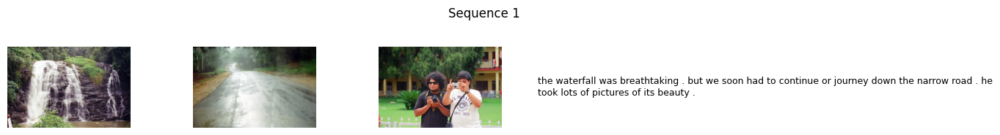

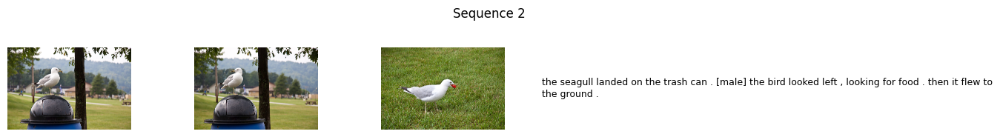

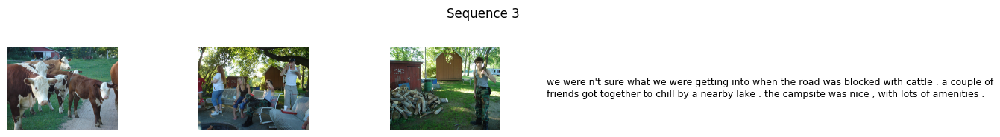

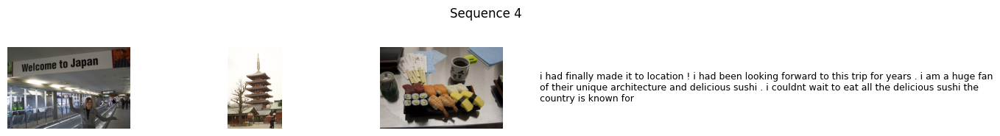

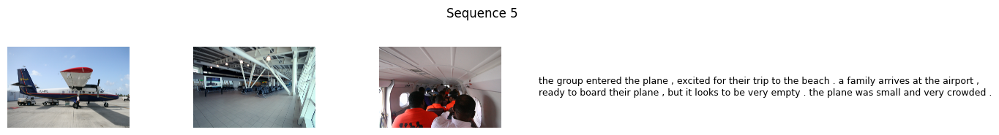

In [24]:
# 📘 Cell 4: Display dataset format with image sequence and caption in right column
import matplotlib.pyplot as plt
from matplotlib import gridspec

n_rows = 5
samples = random.sample(train_data, n_rows)

for row_idx, sample in enumerate(samples):
    fig = plt.figure(figsize=(14, 3))
    gs = gridspec.GridSpec(2, len(sample["images"]) + 1, width_ratios=[1] * len(sample["images"]) + [2])

    for i, img_id in enumerate(sample["images"]):
        ax = plt.subplot(gs[0, i])
        img_path = os.path.join(image_dir, f"{img_id}.jpg")
        image = Image.open(img_path).convert("RGB")
        ax.imshow(image)
        ax.axis('off')

    # Caption in last column
    ax_text = plt.subplot(gs[0, -1])
    ax_text.axis('off')
    ax_text.text(0, 0.5, sample["caption"], wrap=True, fontsize=9, va='center')

    plt.suptitle(f"Sequence {row_idx + 1}", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()

100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:17<00:00,  1.08s/it]


Epoch 1 - Avg Loss: 2.8133


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:23<00:00,  1.09s/it]


Epoch 2 - Avg Loss: 2.2552


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:22<00:00,  1.08s/it]


Epoch 3 - Avg Loss: 1.8684


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:11<00:00,  1.06s/it]


Epoch 4 - Avg Loss: 1.5038


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:15<00:00,  1.07s/it]


Epoch 5 - Avg Loss: 1.1731


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:21<00:00,  1.08s/it]


Epoch 6 - Avg Loss: 0.9070


100%|████████████████████████████████████████████████████████████████████████████████| 574/574 [10:22<00:00,  1.08s/it]


Epoch 7 - Avg Loss: 0.7176

===== Test Sample =====
Image IDs: ['102720295', '102718687', '102718873']
Caption:
 we had a great night out with friends . waking up early to go to a barbecue at a friend 's house . a lot of people were on the street having a good time .


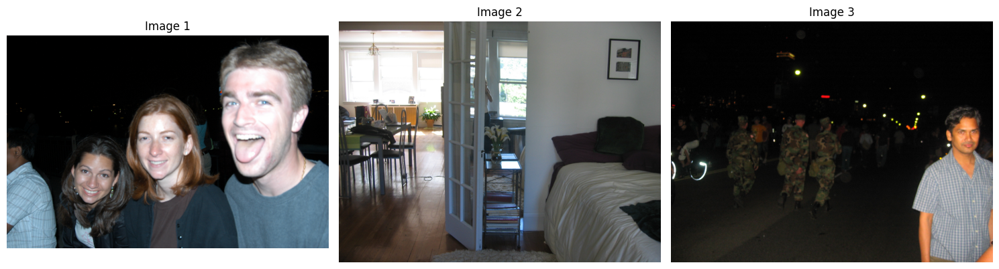

In [3]:
# Dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

class VISTDataset(Dataset):
    def __init__(self, data, image_dir, transform):
        self.data = data
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        entry = self.data[idx]
        images = [Image.open(os.path.join(self.image_dir, f"{img_id}.jpg")).convert("RGB") for img_id in entry["images"]]
        images = [self.transform(img) for img in images]
        return torch.stack(images), entry["caption"]

train_dataset = VISTDataset(train_data, image_dir, transform)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)

# Training
optimizer = torch.optim.AdamW(llm_model.parameters(), lr=5e-5)
llm_model.train()

for epoch in range(7):
    total_loss = 0
    for images, caption in tqdm(train_loader):
        images = images.squeeze(0).to(device)  # shape: (3, 3, 224, 224)

        with torch.no_grad():
            clip_inputs = clip_processor(images=list(images), return_tensors="pt", padding=True).to(device)
            img_features = clip_model.get_image_features(**clip_inputs)  # (3, 512)
            img_embed = img_features.mean(dim=0).unsqueeze(0)  # (1, 512)

        # Prepare prompt
        prompt = "Tell a story based on the following images:\n"
        text_input = prompt + caption[0]
        inputs = tokenizer(text_input, return_tensors="pt", padding=True, truncation=True).to(device)

        outputs = llm_model(**inputs, labels=inputs["input_ids"])
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        del images, inputs, outputs
        gc.collect()

    print(f"Epoch {epoch+1} - Avg Loss: {total_loss / len(train_loader):.4f}")

# Test sample output with image display
print("\n===== Test Sample =====")
if test_data:
    sample = test_data[0]
    print("Image IDs:", sample["images"])
    print("Caption:\n", sample["caption"])

    # Plot the images
    fig, axs = plt.subplots(1, len(sample["images"]), figsize=(15, 5))
    for i, img_id in enumerate(sample["images"]):
        img_path = os.path.join(image_dir, f"{img_id}.jpg")
        image = Image.open(img_path).convert("RGB")
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()
else:
    print("No test data available.")


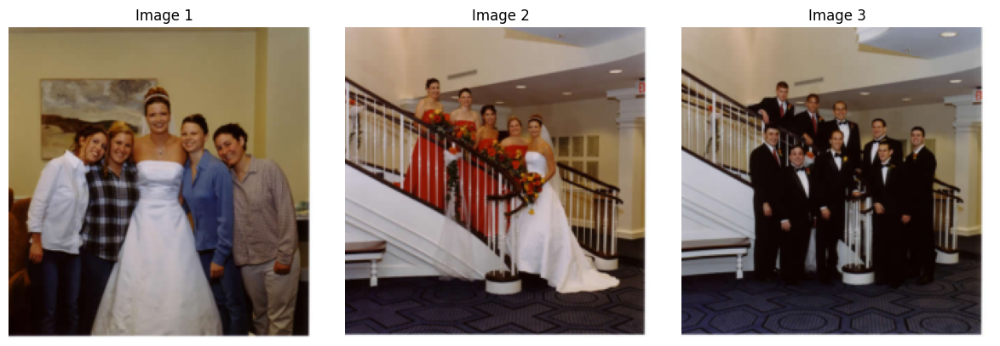

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
[female] took her first trip to location . she saw the beautiful hot air balloons . before she went she saw some blue sky lights . she also went on her bike . she saw some blue sky lights . this is a city in location . she


In [5]:
new_image_paths = ["custom/1.jpeg", "custom/2.jpeg", "custom/3.jpeg"]  # change to your own images
new_images = [transform(Image.open(path).convert("RGB")) for path in new_image_paths]

# Show images
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
for i, img in enumerate(new_images):
    axs[i].imshow(transforms.ToPILImage()(img))
    axs[i].axis("off")
    axs[i].set_title(f"Image {i+1}")
plt.tight_layout()
plt.show()

# Get image embeddings and generate story
llm_model.eval()
with torch.no_grad():
    clip_inputs = clip_processor(images=[transforms.ToPILImage()(img) for img in new_images], return_tensors="pt", padding=True).to(device)
    img_features = clip_model.get_image_features(**clip_inputs)
    img_embed = img_features.mean(dim=0).unsqueeze(0)

    prompt = "Tell a story based on the following images:\n"
    inputs = tokenizer(prompt, return_tensors="pt").to(device)
    outputs = llm_model.generate(**inputs, max_new_tokens=50, do_sample=True, top_k=50)
    print("\nGenerated Story:\n", tokenizer.decode(outputs[0], skip_special_tokens=True))

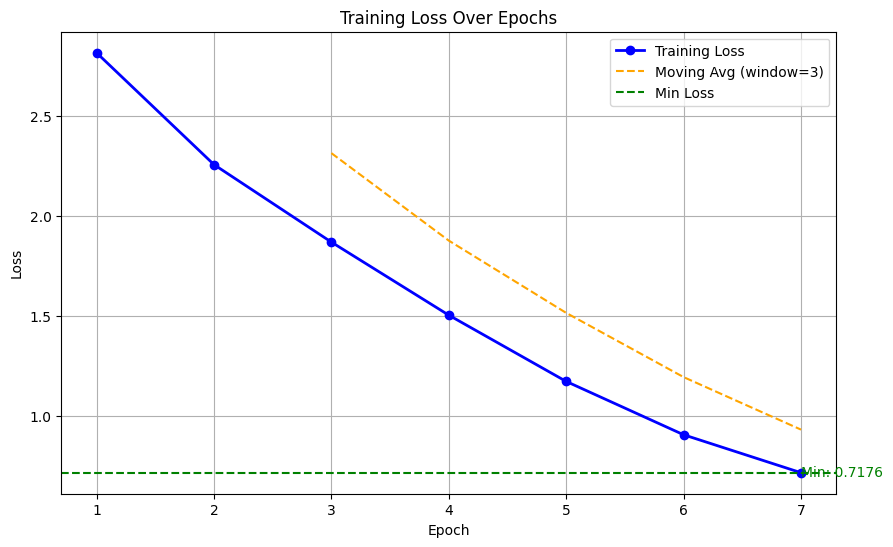

In [13]:
loss_history = [2.8133, 2.2552, 1.8684, 1.5038, 1.1731, 0.9070, 0.7176 ]
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(loss_history)+1), loss_history, marker='o', color='blue', linestyle='-', linewidth=2, label='Training Loss')

# Moving average for smoothing
import numpy as np
window = 3
moving_avg = np.convolve(loss_history, np.ones(window)/window, mode='valid')
plt.plot(range(window, window + len(moving_avg)), moving_avg, color='orange', linestyle='--', label='Moving Avg (window=3)')

plt.xticks(range(1, len(loss_history)+1))
plt.axhline(y=min(loss_history), color='green', linestyle='--', label='Min Loss')
plt.text(len(loss_history), min(loss_history), f"Min: {min(loss_history):.4f}", va='center', ha='left', color='green')

plt.title("Training Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


===== Test Sample 1 =====
Image IDs: ['385815227', '385777800', '385777812']
Ground Truth Caption:
 today is the day that i decide to face my fear of heights . there was an old abandoned amusement park off the road . there was a tall iconic structure that could be seen miles away .


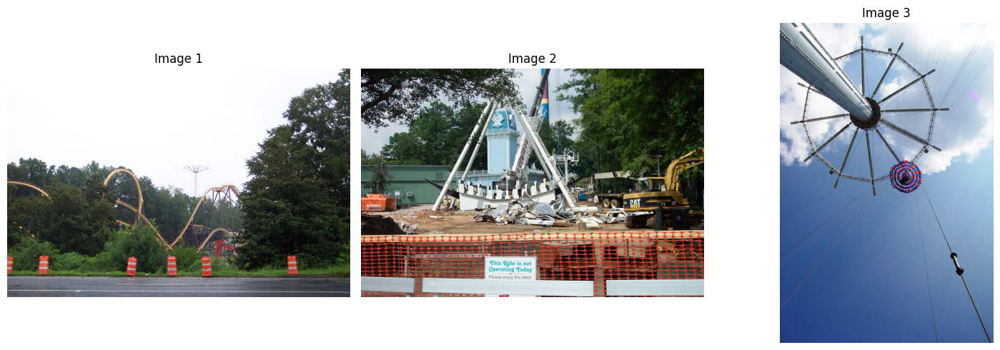

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
we went to my aunt martha 's birthday celebration . [male] 's birthday was a very special day for a ballgame . my aunt martha was having a great time too . the ball game begins , and everyone is excited . the fans were screaming for the stadium to open and the

===== Test Sample 2 =====
Image IDs: ['3357700069', '3358515710', '3357699317']
Ground Truth Caption:
 time for our st. patricks day annual party ! a party is n't a party without amazing food . a party also is n't a party without plenty to drink .


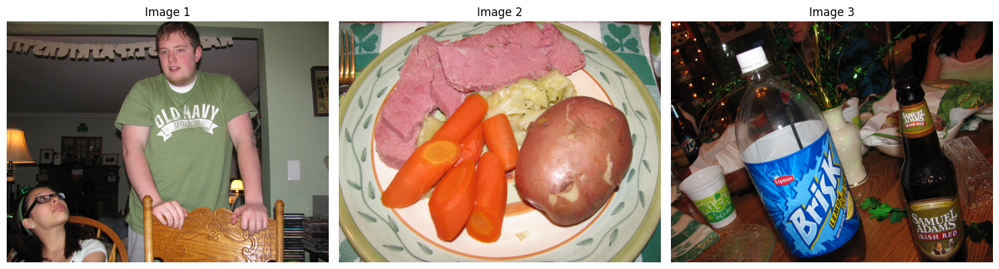

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
somebody wants to go play in the fields he was soon joined by another puppy . hey where 's he going to be seen ? hey where 's he going to be heard ? another puppy inspects the fields he was soon joined by another puppy . hey where 's he going to be seen

===== Test Sample 3 =====
Image IDs: ['997622638', '997623170', '997624052']
Ground Truth Caption:
 [male] and i were excited to be in location location during the 4th of july . there was a huge crowd of people already awaiting the firework show . we were lucky to find a nice spot on the grass to watch the show .


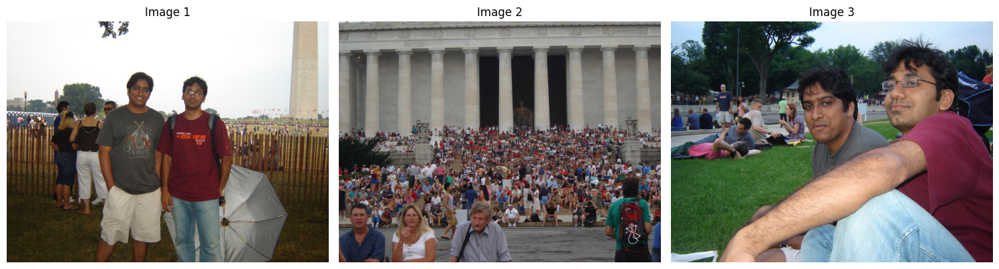

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
yesterday i went on a road trip . our stop along the river provided fun activities for our children . seeing the ferris wheel made my tummy go to my toes . riding in the tea cup made my tummy go to my toes . the cups were lined up so that i could see the

===== Test Sample 4 =====
Image IDs: ['23890767', '23890729', '23890775']
Ground Truth Caption:
 i went with my girlfriend to see the fireworks on the fourth of july . huge crowds showed up for the annual fireworks display . the crowd was thin before the sun went down .


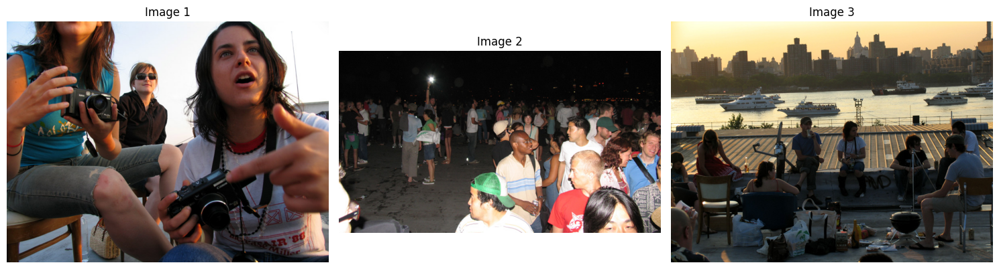

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
we started our trip at this unique structure . unlike many other monuments , this structure is made of concrete and has been designed to withstand the many rocks and other construction . this structure was featured in the city 's greatest works memorial day parade . we saw the ferris wheel ... our trip was exciting .

===== Test Sample 5 =====
Image IDs: ['4572661767', '4572664555', '4572666569']
Ground Truth Caption:
 it was a great day on the beach with friends . there was a carnival near by , so we visited it ! after leaving the beach my wife 's sister catches me looking strangely at my wife .


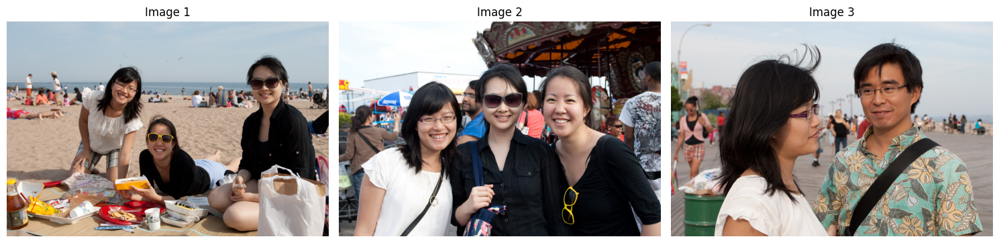

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
they strung lights from pole to pole . there was a car show packed with lights and designs . the strings were acapella decorated for the bands . they sounded great on my guitar . i liked the way they decorated my strings . as i played they stopped when i was ready to go . the

===== Test Sample 6 =====
Image IDs: ['77775527', '77775751', '77775859']
Ground Truth Caption:
 it 's location birthday and everyone seems happy . it was [female] 's birthday today and all her friends from her soccer team showed up and


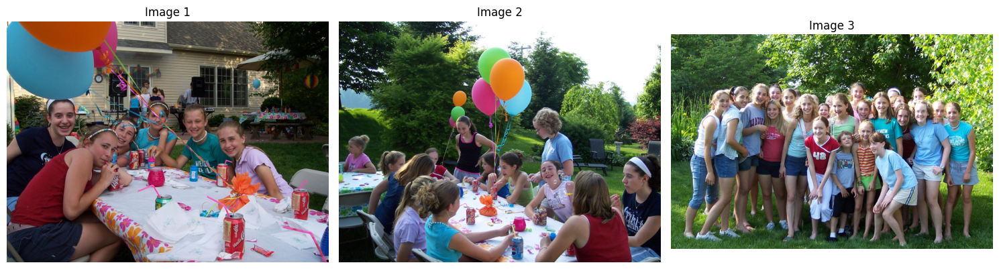

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
we attended the parade . the military parade was about to begin when a man and his son were riding a motorcycle in the evening . the crowd was excited for the parade to start . the little man is gently caressing his crotch with his favorite toy , the magnifying glass . he watched intently as

===== Test Sample 7 =====
Image IDs: ['17584742', '17584390', '17584891']
Ground Truth Caption:
 we went to the long island pier to see fireworks . it was the 4th of july in location location . we got there really early to get good seats .


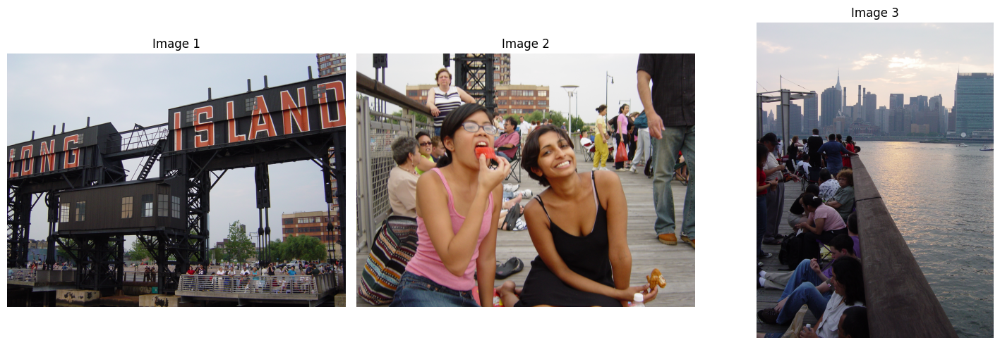

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
it was the annual oktober fest . everyone enjoyed the annual fest . there were peanuts being sold . the smith family enjoyed the local hot air balloon ride . there were even cow rides ! the smith family enjoyed driving the horses around to make sure nothing was amiss . there were peanuts being

===== Test Sample 8 =====
Image IDs: ['6656144649', '6656176707', '6656147845']
Ground Truth Caption:
 our trip to the restaurant was out of this world . a popular fast food restaurant wanted to expand into a new country , and decided that to renovate an old building to test how successful they would be in a new market . we parked in a non space shuttle spot .


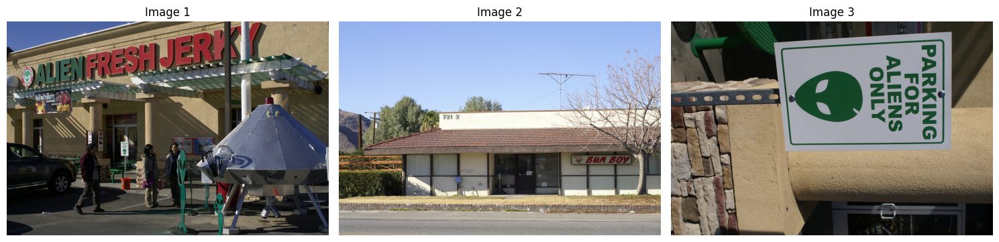

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
a family went on a date to a carnival . the oldest brother came into town with his soon to be daughter . the daughter wore flowers in her hair . they rode on the ferris wheel . they rode on the ferris wheel . there was a fireworks show in the harbor today . we went

===== Test Sample 9 =====
Image IDs: ['4887667755', '4888270044', '4888270816']
Ground Truth Caption:
 i love this bridge . it 's an amazing bridge . she had suggested that i check out this bridge , but wait until night .


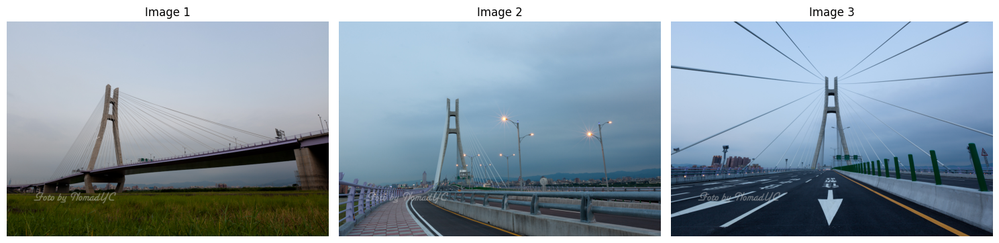

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
the trip to the fair . they had put up a ton of rides there . there were many rides there . there were mini ferris wheel rides . they had inflatable slides . she was able to ride on them . they had inflatable slides . she was able to ride on them . [female

===== Test Sample 10 =====
Image IDs: ['4673159702', '4672537793', '4672534983']
Ground Truth Caption:
 we got together at the church for the wedding rehearsal . this weekend we went to a friends wedding . it was a bit solemn even though it was only a rehearsal .


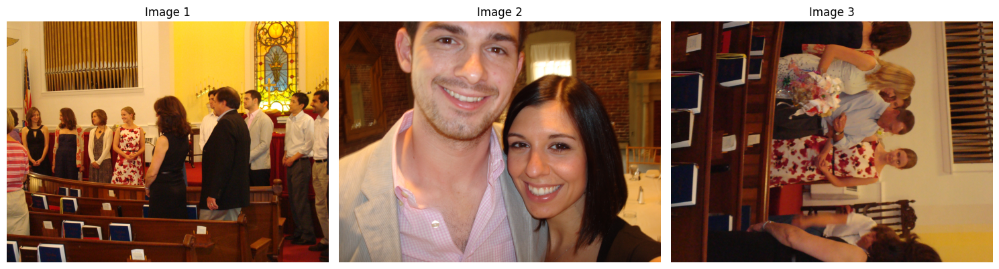

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



Generated Story:
 Tell a story based on the following images:
[male] and [female] decided to go explore the desert . after driving several miles , they came upon a small temple . they saw a pendulum that adjusts to the location 's gravity . they were able to walk among the rocks and other wildlife . there were many species of animals to observe


In [9]:
import random

llm_model.eval()

for n in range(10):
    sample = random.choice(test_data)
    print(f"\n===== Test Sample {n+1} =====")
    print("Image IDs:", sample["images"])
    print("Ground Truth Caption:\n", sample["caption"])

    fig, axs = plt.subplots(1, len(sample["images"]), figsize=(15, 5))
    for i, img_id in enumerate(sample["images"]):
        img_path = os.path.join(image_dir, f"{img_id}.jpg")
        image = Image.open(img_path).convert("RGB")
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()

    images = [transform(Image.open(os.path.join(image_dir, f"{img_id}.jpg")).convert("RGB")) for img_id in sample["images"]]
    with torch.no_grad():
        clip_inputs = clip_processor(images=[transforms.ToPILImage()(img) for img in images], return_tensors="pt", padding=True).to(device)
        img_features = clip_model.get_image_features(**clip_inputs)
        img_embed = img_features.mean(dim=0).unsqueeze(0)

        prompt = "Tell a story based on the following images:\n"
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        outputs = llm_model.generate(**inputs, max_new_tokens=60, do_sample=True, top_k=40)
        print("\nGenerated Story:\n", tokenizer.decode(outputs[0], skip_special_tokens=True))
